# 0. Setup

In [1]:
import sys
import os
sys.path.append(os.path.join('../src'))
from utils import *

import seaborn as sns
import glob
from IPython.display import SVG, display

In [2]:
# Initalizing directory for plots
plotdir = '../plots/4hw3_ani2x'
os.makedirs(plotdir, exist_ok=True)

## 1. Loading trajectories

In [4]:
# Loading trajectories
mm_complex = mda.Universe('../data/4hw3/mm/system_complex.pdb', '../data/4hw3/mm/complex_l1.xtc')
mm_solvent = mda.Universe('../data/4hw3/mm/system_solvent.pdb', '../data/4hw3/mm/solvent_l1.xtc')
ml_complex = mda.Universe('../data/4hw3/ml_ani2x/NEQ_complex_l1_10ps_ani2x_ensemble.pdb', '../data/4hw3/ml_ani2x/NEQ_complex_l1_10ps_ani2x_ensemble.xtc')
ml_solvent = mda.Universe('../data/4hw3/ml_ani2x/NEQ_solvent_l1_10ps_ani2x_ensemble.pdb', '../data/4hw3/ml_ani2x/NEQ_solvent_l1_10ps_ani2x_ensemble.xtc')

## 2. Ligand rotamer distributions

Due to an abundance of planar aromatic systems, only a few dihedrals actually possess flexibility in the ligand. I.e. the acid group and the five bonds of the flexible linker.

These are:
- $C_{AV}$ - $C_{AW}$ - $C_{AQ}$ - $O_{AD}$ : The rotation of the acid group
- $C_{AW}$ - $C_{AV}$ - $C_{AN}$ - $C_{AL}$ : The first dihedral in the flexible linker starting from the benzothiopene
- $C_{AV}$ - $C_{AN}$ - $C_{AL}$ - $C_{AM}$ : The second dihedral in the flexible linker starting from the benzothiopene
- $C_{AN}$ - $C_{AL}$ - $C_{AM}$ - $O_{AO}$ : The third dihedral in the flexible linker starting from the benzothiopene
- $C_{AL}$ - $C_{AM}$ - $O_{AO}$ - $C_{AT}$ : The fourth dihedral in the flexible linker starting from the benzothiopene
- $C_{AM}$ - $O_{AO}$ - $C_{AT}$ - $C_{AJ}$ : The fifth dihedral in the flexible linker starting from the benzothiopene

(See image generated below for ligand atom naming convention)

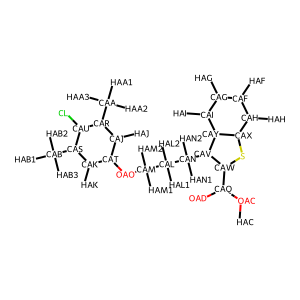

In [5]:
print_atom_names(mm_complex, 'resname 19G')

In [6]:
# Initalizing directory for ligand dihedral plots
dihdrals_plotdir = os.path.join(plotdir,'ligand_dihedrals')
os.makedirs(dihdrals_plotdir, exist_ok=True)

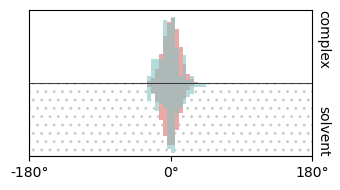

In [7]:
# Acid group
acid_dihedrals = plot_ligand_dihedral_distributions('resname 19G', ('CAV','CAW','CAQ','OAD'),
                                                    mm_complex, mm_solvent, ml_complex, ml_solvent,
                                                    atom_name_scheme='complex',
                                                    save_to=dihdrals_plotdir+'/dihedral_acid.svg')

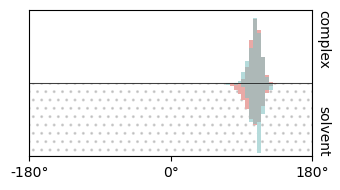

In [8]:
# Linker 1
linker1_dihedrals = plot_ligand_dihedral_distributions('resname 19G', ('CAW','CAV','CAN','CAL'),
                                                        mm_complex, mm_solvent, ml_complex, ml_solvent,
                                                        atom_name_scheme='complex',
                                                        save_to=dihdrals_plotdir+'/dihedral_linker1.svg')

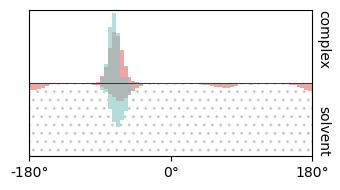

In [9]:
# Linker 2
linker2_dihedrals = plot_ligand_dihedral_distributions('resname 19G', ('CAV','CAN','CAL','CAM'),
                                                        mm_complex, mm_solvent, ml_complex, ml_solvent,
                                                        atom_name_scheme='complex',
                                                        save_to=dihdrals_plotdir+'/dihedral_linker2.svg')

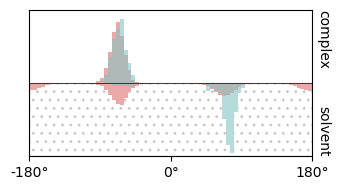

In [10]:
# Linker 3
linker3linker1_dihedrals = _dihedrals = plot_ligand_dihedral_distributions('resname 19G', ('CAN','CAL','CAM','OAO'),
                                                    mm_complex, mm_solvent, ml_complex, ml_solvent,
                                                    atom_name_scheme='complex',
                                                    save_to=dihdrals_plotdir+'/dihedral_linker3.svg')

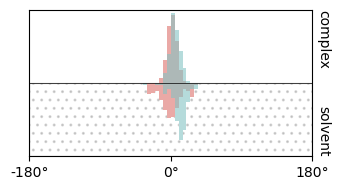

In [11]:
# Linker 4
linker4_dihedrals = plot_ligand_dihedral_distributions('resname 19G', ('CAL','CAM','OAO','CAT'),
                                                        mm_complex, mm_solvent, ml_complex, ml_solvent,
                                                        atom_name_scheme='complex',
                                                        save_to=dihdrals_plotdir+'/dihedral_linker4.svg')

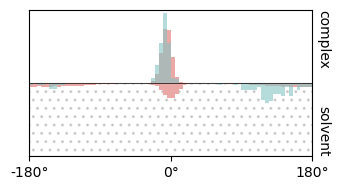

In [12]:
# Linker 5
linker4_dihedrals = plot_ligand_dihedral_distributions('resname 19G', ('CAM','OAO','CAT','CAJ'),
                                                        mm_complex, mm_solvent, ml_complex, ml_solvent,
                                                        atom_name_scheme='complex',
                                                        save_to=dihdrals_plotdir+'/dihedral_linker5.svg')

## 3. Protein-ligand distance distributions

Based mostly on the average distance analysis and structural reasonninng, somewhat in agreement with interaction fingerprinting analysis, these candidates for protein-ligand probes are proposed:

- Acid group ($O_{1}$, $O_{2}$, $C_{12}$): ARG263
- 5-ring of benzothiopene ($C_{AV}$, $C_{AW}$, $C_{AX}$, $C_{AY}$, $S$): VAL253, THR266
- 6-ring of benzothiopene ($C_{AY}$, $C_{AI}$, $C_{AH}$, $C_{AG}$, $C_{AF}$): PHE228, MET231, PHE270
- Linker ($C_{AN}$, $C_{AL}$, $C_{AM}$, $O_{AO}$): LEU246, PHE254, LEU267
- Phenyl ($C_{AT}$, $C_{AK}$, $C_{AS}$, $C_{AU}$, $C_{AR}$, $C_{AJ}$): LEU246, MET250, PHE270
- Chloride ($Cl$): LEU235, LEU246, PHE270, VAL274, LEU290

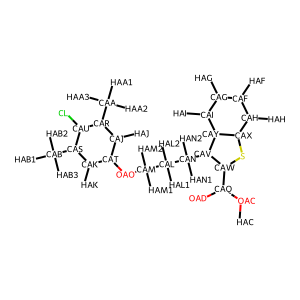

In [13]:
print_atom_names(mm_complex, 'resname 19G')

In [14]:
# Initalizing directory for distance probe plots
distance_plotdir = os.path.join(plotdir, 'distance_probes')
os.makedirs(distance_plotdir, exist_ok=True)

### 3.1 Mean distance matrices

  0%|          | 0/10001 [00:00<?, ?it/s]

100%|██████████| 10001/10001 [00:11<00:00, 894.68it/s]


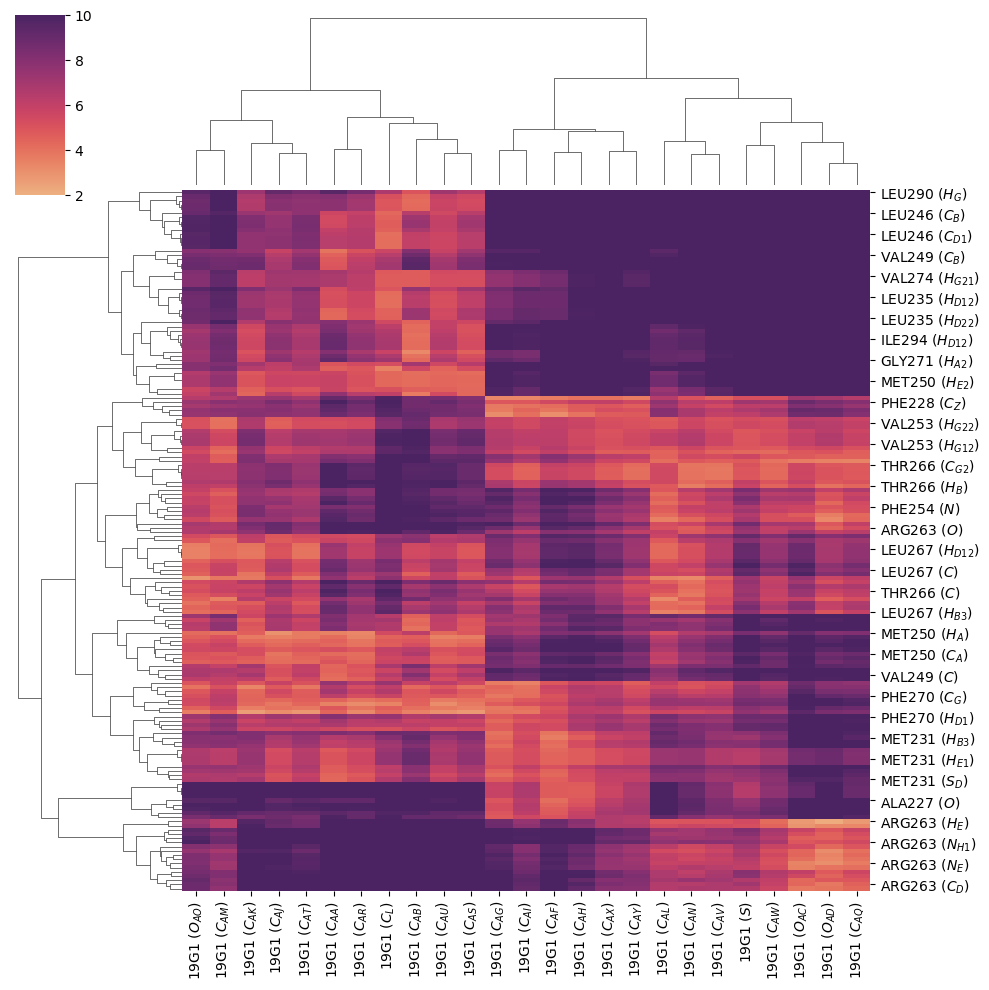

In [15]:
mm_dists = plot_distance_matrix(mm_complex,
                                "resname 19G and not element H",
                                "protein and around 5 resname 19G",
                                measure='mean', sel2_cutoff=5,
                                save_to=os.path.join(distance_plotdir, "heatmap_mm_protein_around_5_ligand_mean.svg"))

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:00<00:00, 717.96it/s]


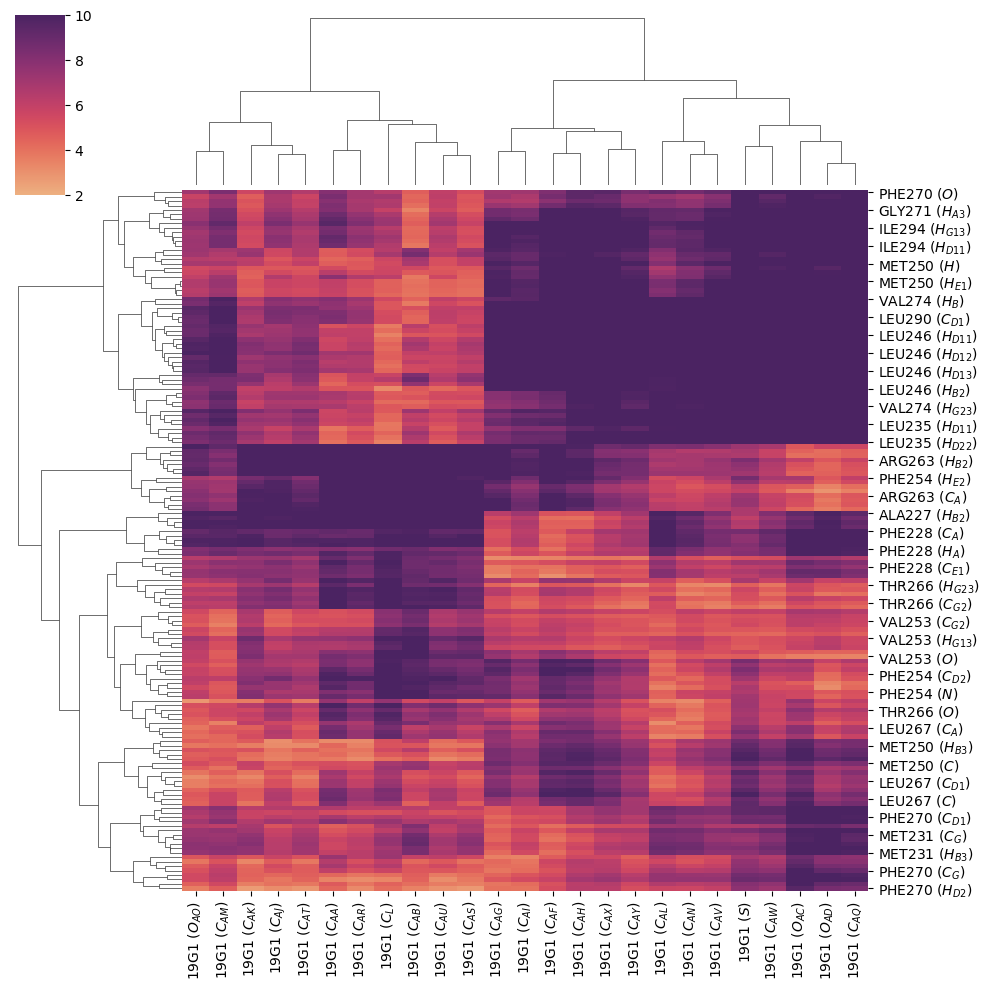

In [16]:
# Difference between MM and ML
ml_dists = plot_distance_matrix(ml_complex,
                                "resname 19G and not element H",
                                "protein and around 5 resname 19G",
                                measure='mean', sel2_cutoff=5,
                                save_to=os.path.join(distance_plotdir, "heatmap_ml_protein_around_5_ligand_mean.svg"))

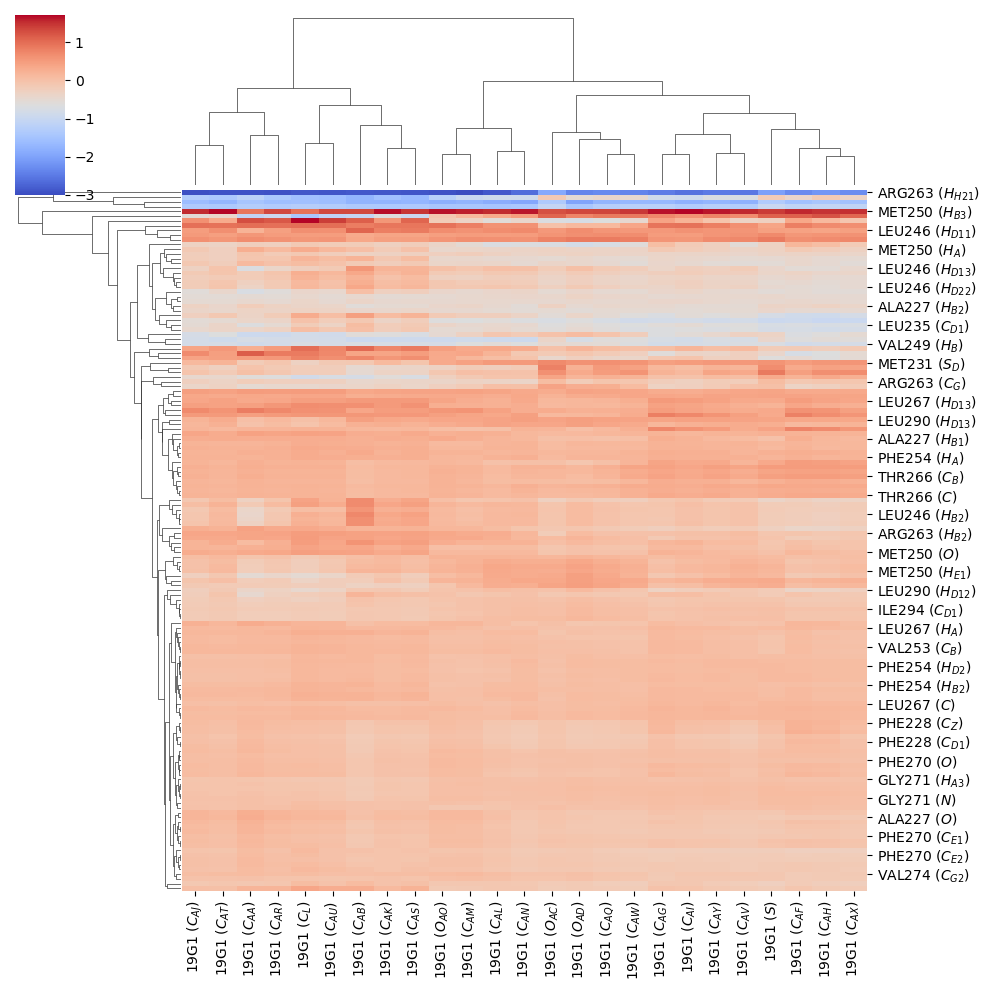

In [17]:
# Difference between MM and ML
sns.clustermap((mm_dists - ml_dists).dropna(), cmap="coolwarm")
# Red  = ML distance shorter than MM
# Blue = ML distance longer  than MM

### 3.2 Probes

Based mostly on the average distance analysis and structural reasoning. these candidates for protein-ligand probes are proposed:

- Acid group ($O_{AC}$, $O_{AD}$, $C_{AQ}$): ARG263
- 5-ring of benzothiopene ($C_{AV}$, $C_{AW}$, $C_{AX}$, $C_{AY}$, $S$): VAL253, THR266
- 6-ring of benzothiopene ($C_{AX}$, $C_{AY}$, $C_{AI}$, $C_{AH}$, $C_{AG}$, $C_{AF}$): PHE228, MET231, PHE270
- Linker ($C_{AN}$, $C_{AL}$, $C_{AM}$, $O_{AO}$): LEU246, PHE254, LEU267
- Phenoxy ring ($C_{AT}$, $C_{AK}$, $C_{AS}$, $C_{AU}$, $C_{AR}$, $C_{AJ}$): LEU246, MET250, PHE270
- Chloride ($Cl$): LEU235, LEU246, PHE270, VAL274, LEU290

#### 3.2.1 Probe exploration

In [18]:
# Setting probe candidates
distance_probes = {
    'acid':
        {'ligand_query': 'resname 19G and name OAC OAD CAQ',
         'residues': ['ARG263']},
    '5-ring_benzothiopene':
        {'ligand_query': 'resname 19G and name CAV CAW CAX CAY S',
         'residues': ['VAL253', 'THR266']},
    '6-ring_benzothiopene':
        {'ligand_query': 'resname 19G and name CAX CAY CAI CAH CAG CAF',
         'residues': ['PHE228', 'MET231', 'PHE270']},
    'linker':
        {'ligand_query': 'resname 19G and name CAN CAL CAM OAO',
         'residues': ['LEU246', 'LEU254', 'LEU267']},
    'phenoxy':
        {'ligand_query': 'resname 19G and name CAT CAK CAS CAU CAR CAJ',
         'residues': ['LEU246', 'MET250', 'PHE270']},
    'chloride':
        {'ligand_query': 'resname 19G and name CL',
         'residues': ['LEU235', 'LEU246', 'PHE270', 'VAL274', 'LEU290']},
}

acid
	 ARG263


100%|██████████| 100/100 [00:00<00:00, 1031.97it/s]
/Users/frederikespersenknudsen/Local/Big storage/KLL/mm_ml_analysis/notebooks/../src/utils.py:519: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
100%|██████████| 100/100 [00:00<00:00, 1121.53it/s]
/Users/frederikespersenknudsen/Local/Big storage/KLL/mm_ml_analysis/notebooks/../src/utils.py:450: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


5-ring_benzothiopene
	 VAL253


100%|██████████| 100/100 [00:00<00:00, 1030.44it/s]


	 THR266


100%|██████████| 100/100 [00:00<00:00, 823.40it/s]


6-ring_benzothiopene
	 PHE228


100%|██████████| 100/100 [00:00<00:00, 836.99it/s]


	 MET231


100%|██████████| 100/100 [00:00<00:00, 877.26it/s]


	 PHE270


100%|██████████| 100/100 [00:00<00:00, 858.68it/s]


linker
	 LEU246


100%|██████████| 100/100 [00:00<00:00, 769.14it/s]


	 LEU254


100%|██████████| 100/100 [00:00<00:00, 1084.99it/s]


	 LEU267


100%|██████████| 100/100 [00:00<00:00, 1111.16it/s]


phenoxy
	 LEU246


100%|██████████| 100/100 [00:00<00:00, 1106.76it/s]


	 MET250


100%|██████████| 100/100 [00:00<00:00, 1024.60it/s]
/Users/frederikespersenknudsen/Local/Big storage/KLL/mm_ml_analysis/notebooks/../src/utils.py:499: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(ncols=len(distances_mm),
100%|██████████| 100/100 [00:00<00:00, 1093.97it/s]


	 PHE270


100%|██████████| 100/100 [00:00<00:00, 1087.33it/s]


chloride
	 LEU235


100%|██████████| 100/100 [00:00<00:00, 1098.00it/s]


	 LEU246


100%|██████████| 100/100 [00:00<00:00, 1138.58it/s]


	 PHE270


100%|██████████| 100/100 [00:00<00:00, 1111.47it/s]


	 VAL274


100%|██████████| 100/100 [00:00<00:00, 1100.82it/s]


	 LEU290


100%|██████████| 100/100 [00:00<00:00, 1087.26it/s]


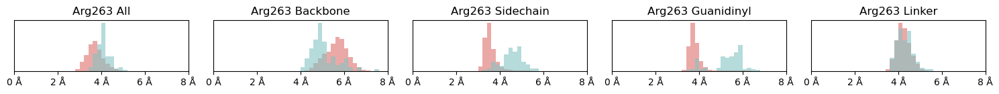

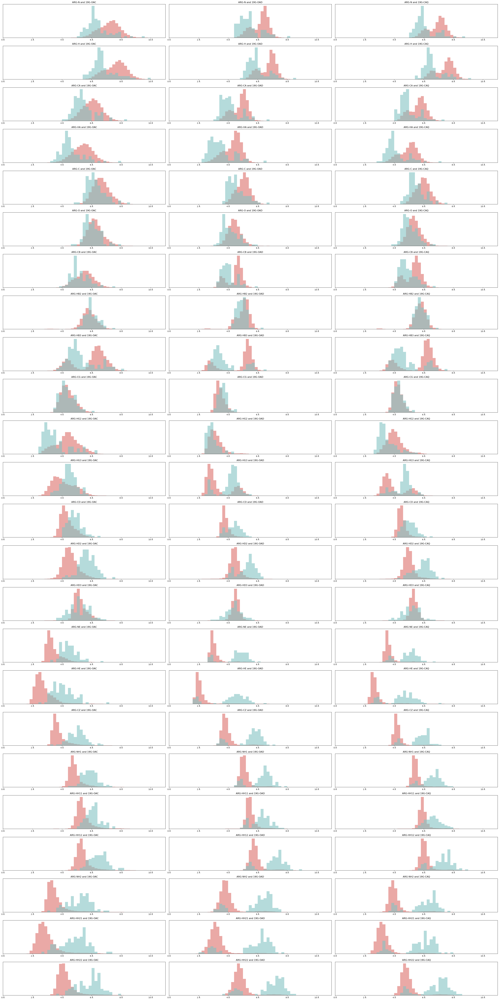

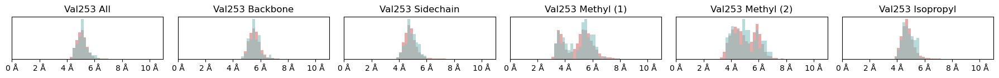

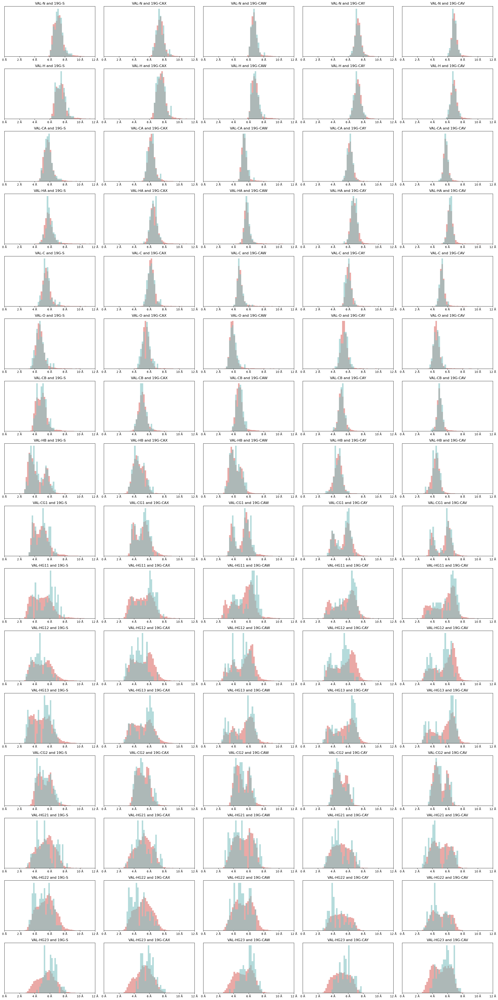

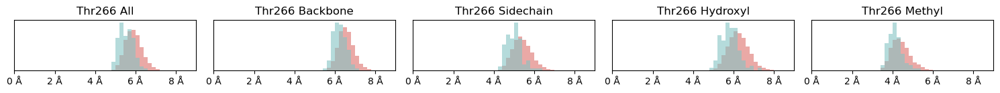

...

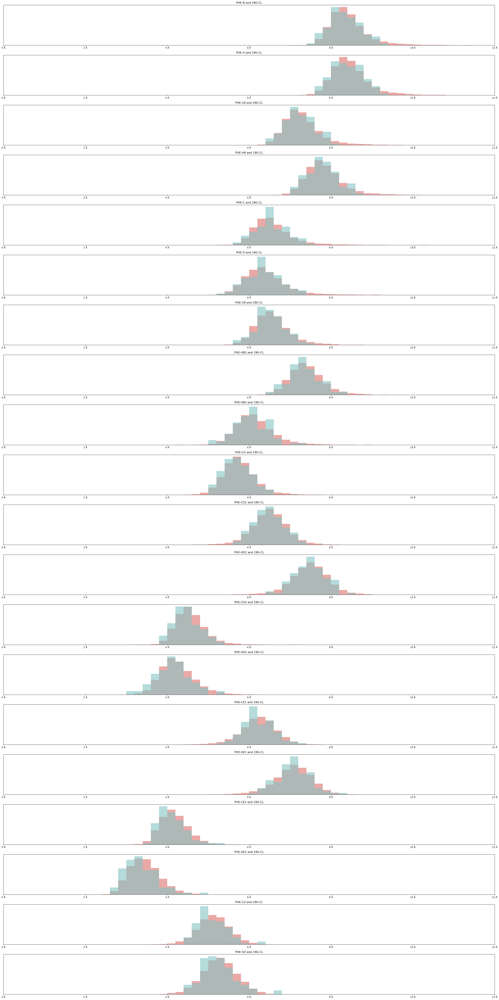

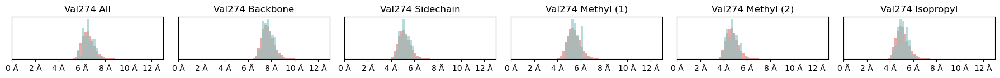

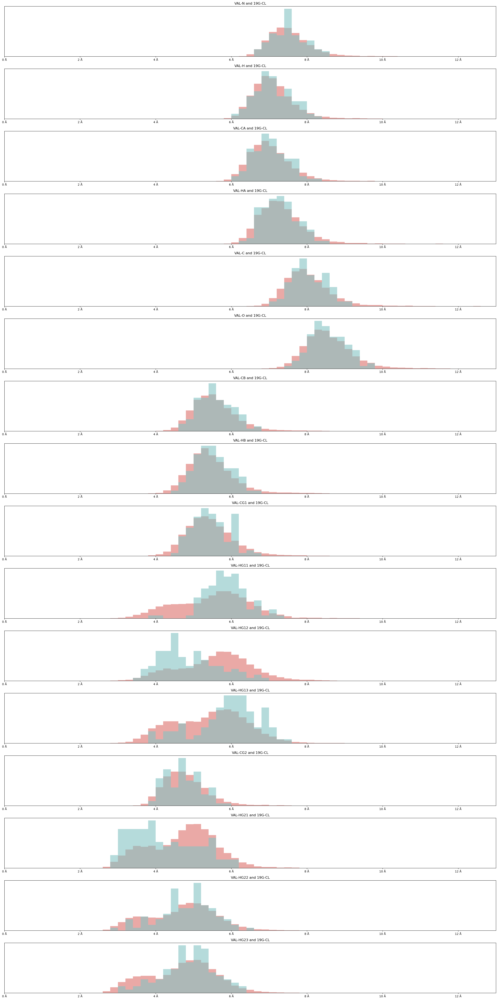

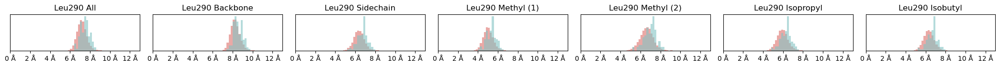

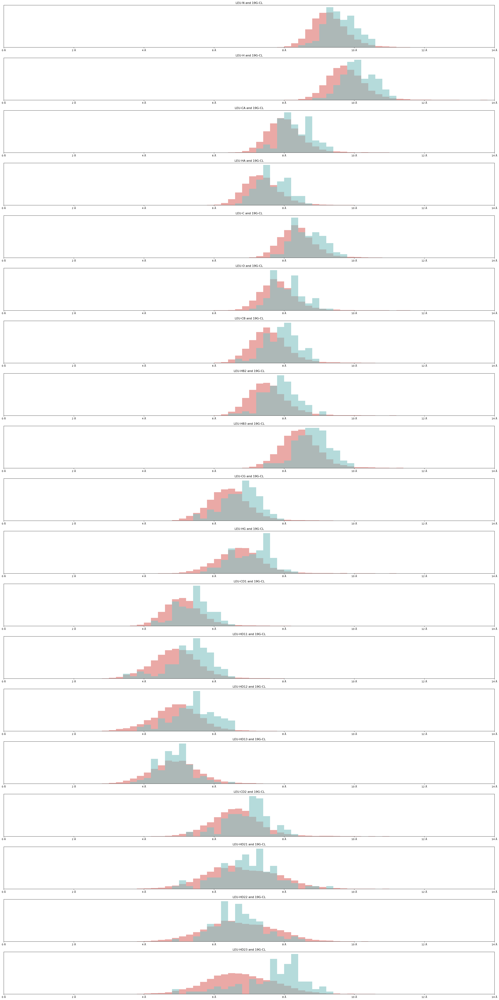

In [19]:
# Candidate probe distance distributions for substrctures and single atoms
replot = False

# Looping over all probes
for ligand_substructure in distance_probes:
    print(ligand_substructure)

    for residue in distance_probes[ligand_substructure]['residues']:
        print('\t', residue)

        # Creating directory for plots
        probe_plotdir = os.path.join(distance_plotdir, 'ligand_'+ligand_substructure, residue.lower())
        os.makedirs(probe_plotdir, exist_ok=True)

        # Plotting residue # Plotting residue substructure probes
        if f'substructure_distances_{ligand_substructure}_{residue.lower()}.svg' not in os.listdir(probe_plotdir) or replot:
            plot_residue_substructure_com_distance_distributions(
                mm_complex,
                ml_complex,
                'protein and resid ' + residue[3:].lower(),
                distance_probes[ligand_substructure]['ligand_query'],
                save_to=os.path.join(probe_plotdir, f'substructure_distances_{ligand_substructure}_{residue.lower()}.svg')
            )

        # Plotting single atom probes
        if f'single_atom_distances_{ligand_substructure}_{residue.lower()}.svg' not in os.listdir(probe_plotdir) or replot:
            plot_single_atom_distance_distributions(
                mm_complex,
                ml_complex,
                'protein and resid ' + residue[3:].lower(),
                distance_probes[ligand_substructure]['ligand_query'],
                save_to=os.path.join(probe_plotdir, f'single_atom_distances_{ligand_substructure}_{residue.lower()}.svg')
            )

CHLORIDE


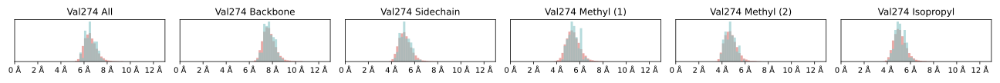

CHLORIDE


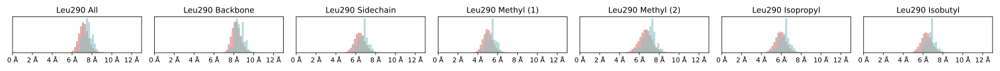

CHLORIDE


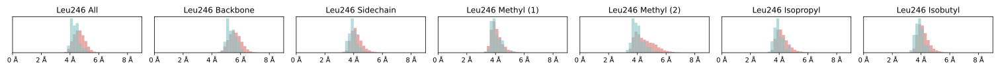

CHLORIDE


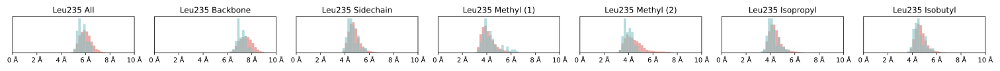

CHLORIDE


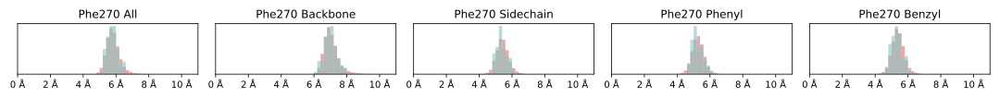

LINKER


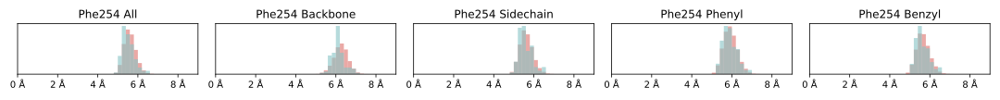

LINKER


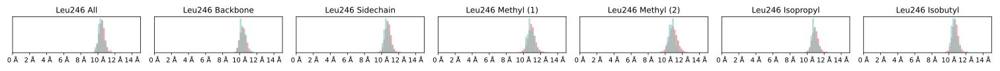

LINKER


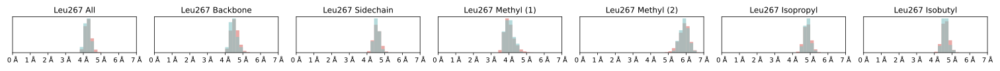

ACID


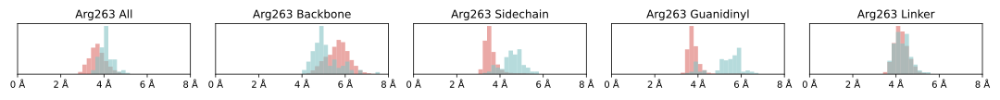

6-RING


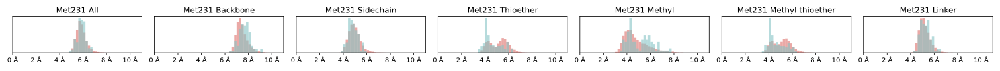

6-RING


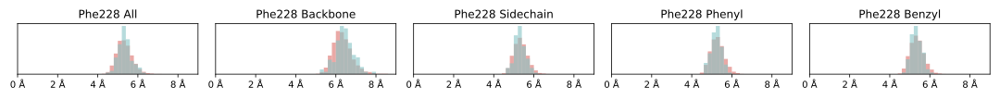

6-RING


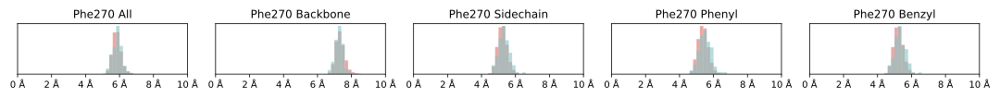

PHENOXY


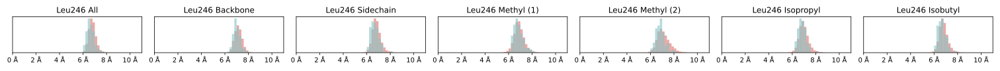

PHENOXY


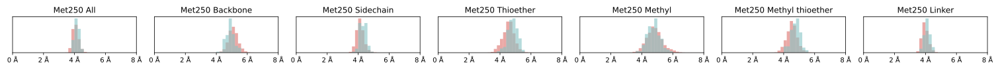

PHENOXY


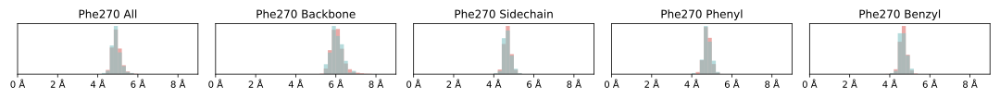

5-RING


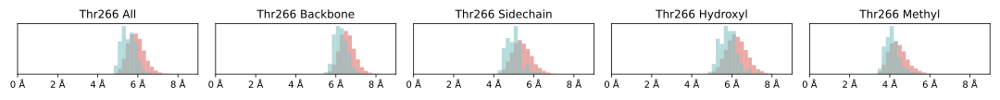

5-RING


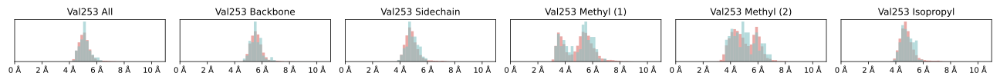

In [20]:
# Checking substructure distance distributions
svg_files = glob.glob(os.path.join(plotdir, '**/substructure_distances_*.svg'), recursive=True)
for file in svg_files:
    print(file.split('/')[-1].split('_')[2].upper())
    display(SVG(filename=file))

acid


100%|██████████| 100/100 [00:00<00:00, 1015.21it/s]


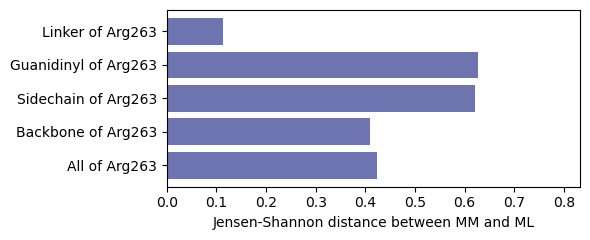

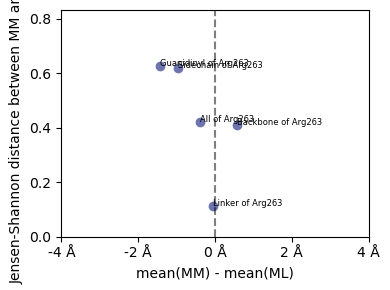

5-ring_benzothiopene


100%|██████████| 100/100 [00:00<00:00, 1046.48it/s]


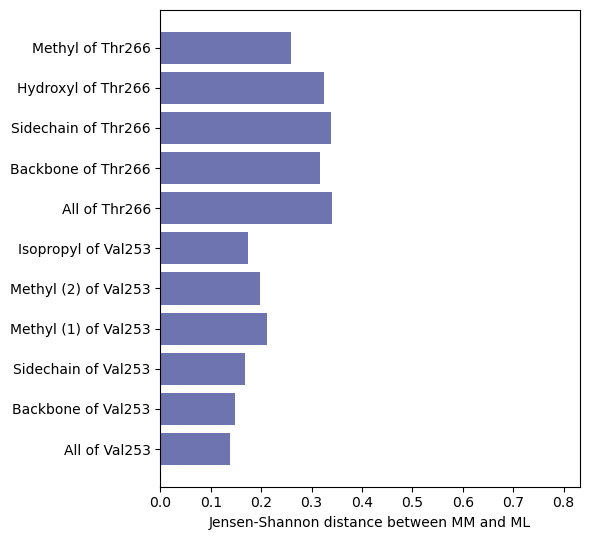

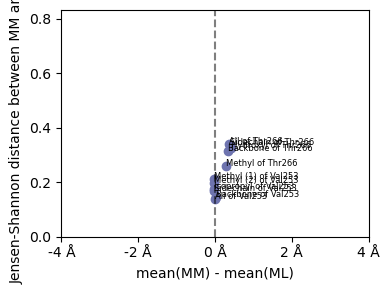

6-ring_benzothiopene


100%|██████████| 100/100 [00:00<00:00, 1016.39it/s]


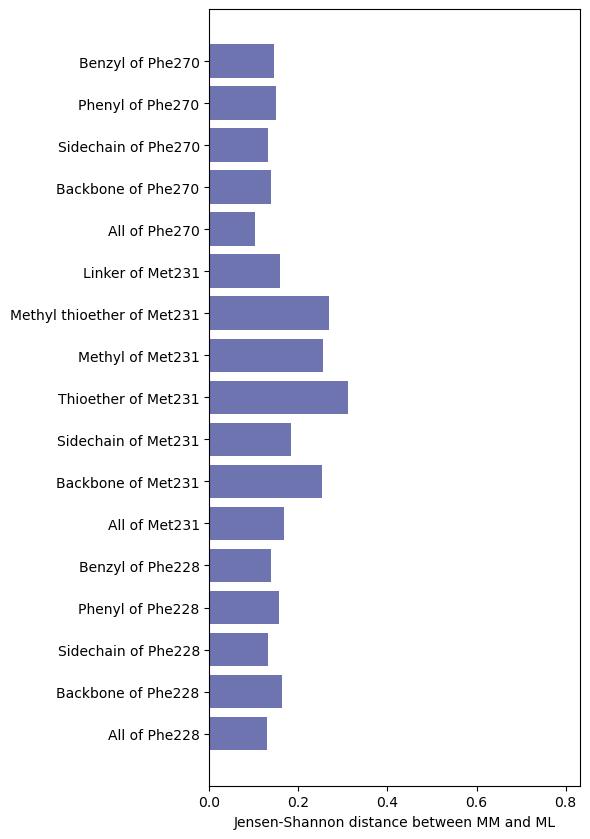

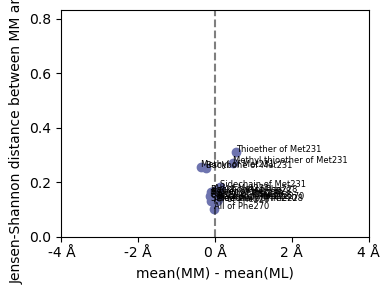

linker


100%|██████████| 100/100 [00:00<00:00, 1068.53it/s]


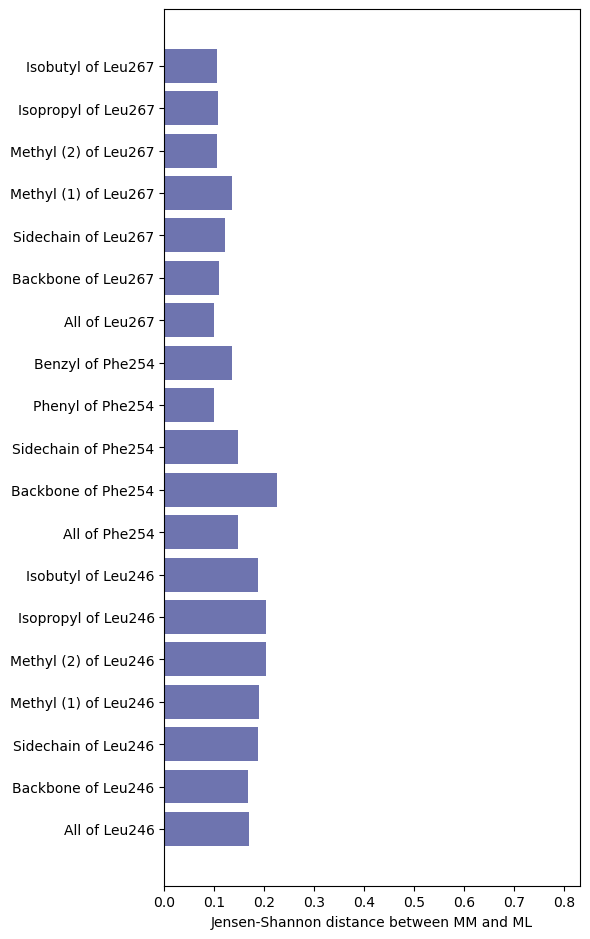

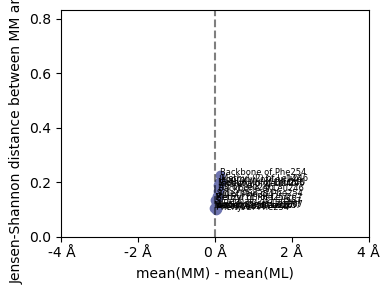

phenoxy


100%|██████████| 100/100 [00:00<00:00, 1072.33it/s]


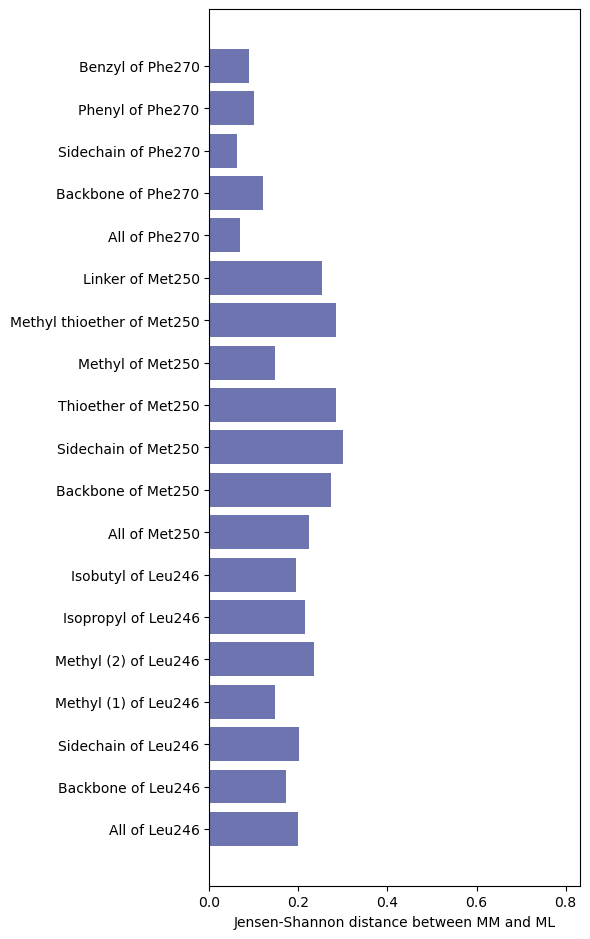

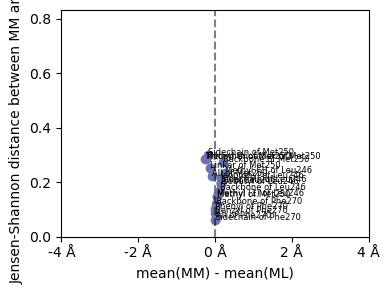

chloride


100%|██████████| 100/100 [00:00<00:00, 489.09it/s]


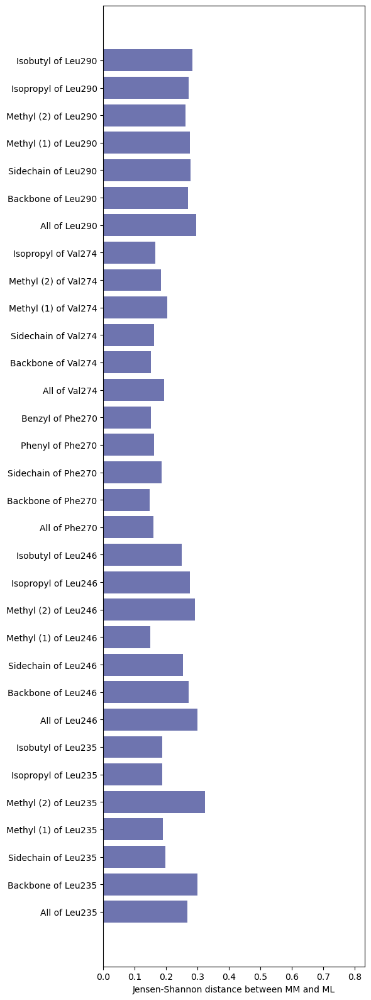

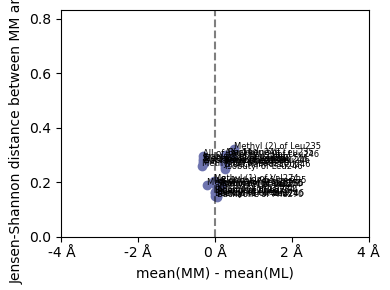

In [21]:
# Jensen-Shannon distance plots for candidate substructures

# Looping over all probes
for ligand_substructure in distance_probes:
    print(ligand_substructure)

    plot_residues_substructure_com_distance_divergence(
        mm_complex,
        ml_complex,
        "protein and resid " + ' '.join([res[3:] for res in distance_probes[ligand_substructure]['residues']]),
        distance_probes[ligand_substructure]['ligand_query'],
        save_to=os.path.join(distance_plotdir, 'ligand_'+ligand_substructure, f'jensen-shannon-distance_{ligand_substructure}.svg'),
        scatter=True,
        save_scatter_to=os.path.join(distance_plotdir, 'ligand_'+ligand_substructure, f'jensen-shannon-distance_scatter_{ligand_substructure}.svg')
    )

#### 3.2.2 Probe refinement

100%|██████████| 100/100 [00:00<00:00, 482.49it/s]


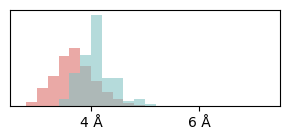

100%|██████████| 100/100 [00:00<00:00, 483.11it/s]


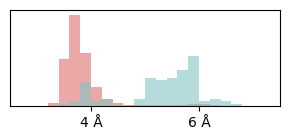

In [22]:
# Acid - Arg263 - Guanidinyl
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 263",
    distance_probes['acid']['ligand_query'],
    xlims=(2.5,7.5),
    save_to=os.path.join(distance_plotdir, 'ligand_acid', 'arg263', 'distance_acid_arg263.svg')
)

plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 263" + " and " + residue_substructure_queries['ARG']['Guanidinyl'],
    distance_probes['acid']['ligand_query'],
    xlims=(2.5,7.5),
    save_to=os.path.join(distance_plotdir, 'ligand_acid', 'arg263', 'distance_acid_arg263_guanidinyl.svg')
)

  0%|          | 0/10001 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:00<00:00, 477.91it/s]


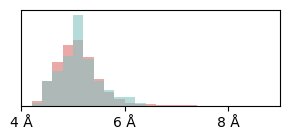

100%|██████████| 100/100 [00:00<00:00, 480.82it/s]


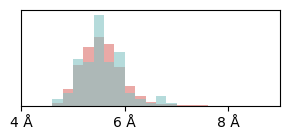

In [23]:
# 5-ring benzothiopene - Val253 - Backbone
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 253",
    distance_probes['5-ring_benzothiopene']['ligand_query'],
    xlims=(4,9),
    save_to=os.path.join(distance_plotdir, 'ligand_5-ring_benzothiopene', 'val253', 'distance_ligand_5-ring_benzothiopene_val253.svg')
)

plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 253" + " and " + residue_substructure_queries['VAL']['Backbone'],
    distance_probes['5-ring_benzothiopene']['ligand_query'],
    xlims=(4,9),
    save_to=os.path.join(distance_plotdir, 'ligand_5-ring_benzothiopene', 'val253', 'distance_ligand_5-ring_benzothiopene_val253_backbone.svg')
)

100%|██████████| 100/100 [00:00<00:00, 484.72it/s]


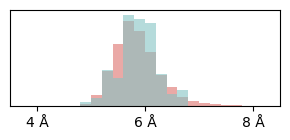

100%|██████████| 100/100 [00:00<00:00, 493.01it/s]


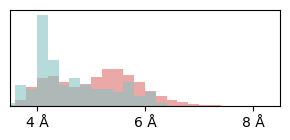

In [24]:
# 6-ring benzothiopene - Met231 - Methyl thioether
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 231",
    distance_probes['6-ring_benzothiopene']['ligand_query'],
    xlims=(3.5,8.5),
    save_to=os.path.join(distance_plotdir, 'ligand_6-ring_benzothiopene', 'met231', 'distance_ligand_6-ring_benzothiopene_met231.svg')
)

plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 231" + " and " + residue_substructure_queries['MET']['Methyl thioether'],
    distance_probes['6-ring_benzothiopene']['ligand_query'],
    xlims=(3.5,8.5),
    save_to=os.path.join(distance_plotdir, 'ligand_6-ring_benzothiopene', 'met231', 'distance_ligand_6-ring_benzothiopene_met231_methylthioether.svg')
)

100%|██████████| 100/100 [00:00<00:00, 487.82it/s]


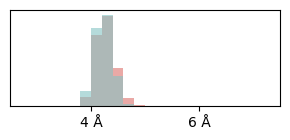

100%|██████████| 100/100 [00:00<00:00, 380.13it/s]


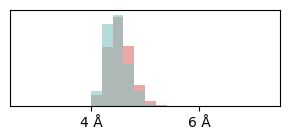

In [25]:
# Linker - Leu267 - Backbone
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 267",
    distance_probes['linker']['ligand_query'],
    xlims=(2.5,7.5),
    save_to=os.path.join(distance_plotdir, 'ligand_linker', 'leu267', 'distance_ligand_linker_leu267.svg')
)

plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 267" + " and " + residue_substructure_queries['LEU']['Backbone'],
    distance_probes['linker']['ligand_query'],
    xlims=(2.5,7.5),
    save_to=os.path.join(distance_plotdir, 'ligand_linker', 'leu267', 'distance_ligand_linker_leu267_backbone.svg')
)

  0%|          | 0/10001 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:00<00:00, 482.50it/s]


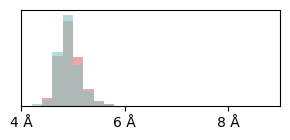

100%|██████████| 100/100 [00:00<00:00, 481.68it/s]


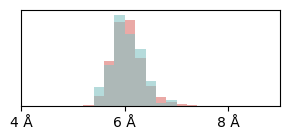

In [26]:
# Phenoxy ring - Phe270 - Backbone
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 270",
    distance_probes['phenoxy']['ligand_query'],
    xlims=(4,9),
    save_to=os.path.join(distance_plotdir, 'ligand_phenoxy', 'phe270', 'distance_ligand_phenoxy_phe270.svg')
)

plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 270" + " and " + residue_substructure_queries['PHE']['Backbone'],
    distance_probes['phenoxy']['ligand_query'],
    xlims=(4,9),
    save_to=os.path.join(distance_plotdir, 'ligand_phenoxy', 'phe270', 'distance_ligand_phenoxy_phe270_backbone.svg')
)

100%|██████████| 100/100 [00:00<00:00, 478.71it/s]


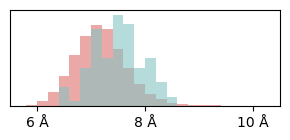

In [27]:
# Chloride - Leu290 - All
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 290",
    distance_probes['chloride']['ligand_query'],
    xlims=(5.5,10.5),
    save_to=os.path.join(distance_plotdir, 'ligand_chloride', 'leu290', 'distance_ligand_chloride_leu290.svg')
)

100%|██████████| 100/100 [00:00<00:00, 494.86it/s]


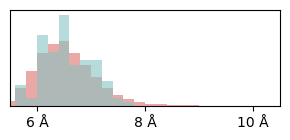

In [28]:
# Chloride - Val274 - All
plot_com_distance_distributions(
    mm_complex,
    ml_complex,
    "protein and resid 274",
    distance_probes['chloride']['ligand_query'],
    xlims=(5.5,10.5),
    save_to=os.path.join(distance_plotdir, 'ligand_chloride', 'val274', 'distance_ligand_chloride_val274.svg')
)